Plotting the het per individual in a horizonplot

In [1]:
%run ../scripts/notebook_settings.py

In [2]:
zarr_dir = "/faststorage/project/baboondiversity/data/PG_panu3_zarr_01_03_2021/callset.zarr/{}"
meta_data_samples = pd.read_table("../data/metadata_with_x_missing.txt", sep=" ")
#Opening the zarr data
#callset = zarr.open_group(zarr_dir.format("chrX"), mode='r')
#gt = allel.GenotypeArray(callset["calldata/GT"])
#pos = callset["variants/POS"][:]

Creating the df

Generating dataframe with True/False for het state

In [3]:
#het_array = gt.is_het()

In [4]:
#het_array.take([0, 2], axis=1)

End up choosing to reuse an earlier solution, even though it might be slower

In [5]:
window_size = 100000
chromosomes = [f'chr{x}' for x in range(1, 21)] + ['chrX']

def het_counting(gt):
    return gt.count_het()


chr_df_list = []
for chrom in ["chr7", "chrX"]:
    df_list = []
    callset = zarr.open_group(zarr_dir.format(chrom), mode='r')
    gt = allel.GenotypeArray(callset["calldata/GT"])
    pos = callset["variants/POS"][:]
    for i, row in meta_data_samples.iterrows():
        df = pd.DataFrame()
        individual = (gt.take([row.callset_index], axis=1))
        nnz, windows, counts = allel.windowed_statistic(pos, individual, statistic=het_counting, size=window_size)
        df["het"] = nnz
        df["sex"] = row.Sex
        if i % 50 == 0:
            print(i)
        window_numbering = []
        df.insert(0, column="chrom", value=chrom)
        window_numbering.extend(range(len(nnz)))
        df.insert(1, column="start", value=window_numbering)
        df.insert(2, column = "pop", value = row.PGDP_ID)
        df_list.append(df)
    chr_df = pd.concat(df_list, axis=0)
    chr_df_list.append(chr_df)
    chr_df.to_csv("../steps/het_counts_windows_{}.txt".format(chrom), sep = " ", index=False)
    print("Finished with {}".format(chrom))

0
50
100
150
200
Finished with chr7
0
50
100
150
200
Finished with chrX


In [6]:
full_df = pd.concat(chr_df_list, axis=0)
full_df

,chrom,start,pop,het,sex
0,chr7,0,PD_0199,381,F
1,chr7,1,PD_0199,1120,F
2,chr7,2,PD_0199,335,F
3,chr7,3,PD_0199,269,F
4,chr7,4,PD_0199,195,F
...,...,...,...,...,...
1432,chrX,1432,PD_0794_BAB,2,M
1433,chrX,1433,PD_0794_BAB,4,M
1434,chrX,1434,PD_0794_BAB,5,M
1435,chrX,1435,PD_0794_BAB,14,M


In [7]:
#Reloading the old dataframe
meta_data_samples_old = pd.read_table("../data/meta_data_samples.txt", sep = " ")
meta_data_samples_old

,Unnamed: 0,PGDP_ID,Provider_ID,Provider,Genus,Species,Origin,Sex,address,longitude,latitude,callset_index
0,1,PD_0199,09SNF1101115,Knauf/Chuma/Roos,Papio,anubis,"Serengeti, Tanzania",F,"Serengeti, Mara, Lake Zone, Tanzania",34.742544,-1.996626,0
1,2,PD_0200,11SNF1101115,Knauf/Chuma/Roos,Papio,anubis,"Serengeti, Tanzania",F,"Serengeti, Mara, Lake Zone, Tanzania",34.742544,-1.996626,1
2,3,PD_0201,19SNM1131115,Knauf/Chuma/Roos,Papio,anubis,"Serengeti, Tanzania",M,"Serengeti, Mara, Lake Zone, Tanzania",34.742544,-1.996626,2
3,4,PD_0202,20SNF1131115,Knauf/Chuma/Roos,Papio,anubis,"Serengeti, Tanzania",F,"Serengeti, Mara, Lake Zone, Tanzania",34.742544,-1.996626,3
4,5,PD_0203,21SNF1151115,Knauf/Chuma/Roos,Papio,anubis,"Serengeti, Tanzania",F,"Serengeti, Mara, Lake Zone, Tanzania",34.742544,-1.996626,4
...,...,...,...,...,...,...,...,...,...,...,...,...
155,212,PD_0789,34417_BZ11064,Rogers/Jolly/Phillips-Conroy,Papio,kindae,"Chunga, Zambia",F,"Chunga, Mumbwa District, Central Province, Zambia",26.005210,-15.053557,155
156,213,PD_0790,34418_BZ11065,Rogers/Jolly/Phillips-Conroy,Papio,kindae,"Chunga, Zambia",F,"Chunga, Mumbwa District, Central Province, Zambia",26.005210,-15.053557,156
157,214,PD_0791,34419_BZ11066,Rogers/Jolly/Phillips-Conroy,Papio,kindae,"Chunga, Zambia",F,"Chunga, Mumbwa District, Central Province, Zambia",26.005210,-15.053557,157
158,215,PD_0792,34420_BZ11067,Rogers/Jolly/Phillips-Conroy,Papio,kindae,"Chunga, Zambia",F,"Chunga, Mumbwa District, Central Province, Zambia",26.005210,-15.053557,158


In [8]:
callset_old = zarr.open_group('/faststorage/project/primatediversity/people/kmt/baboon_flagship/steps/callset.zarr', mode='r')
callset.tree(expand=False)
chr_df_list_old = []
for chrom in ["chr7", "chrX"]:
    df_list_old = []
    gt = allel.GenotypeArray(callset_old["{}/calldata/GT".format(chrom)])
    pos = callset_old["{}/variants/POS".format(chrom)][:]
    for i, row in meta_data_samples_old.iterrows():
        df = pd.DataFrame()
        individual = (gt.take([row.callset_index], axis=1))
        nnz, windows, counts = allel.windowed_statistic(pos, individual, statistic=het_counting, size=window_size)
        df["het"] = nnz
        df["sex"] = row.Sex
        if i % 50 == 0:
            print(i)
        window_numbering = []
        df.insert(0, column="chrom", value=chrom)
        window_numbering.extend(range(len(nnz)))
        df.insert(1, column="start", value=window_numbering)
        df.insert(2, column = "pop", value = row.PGDP_ID)
        df_list_old.append(df)
    chr_df_old = pd.concat(df_list_old, axis=0)
    chr_df_list_old.append(chr_df_old)
    chr_df_old.to_csv("../steps/het_counts_windows_{}_old.txt".format(chrom), sep = " ", index=False)
    print("Finished with {}".format(chrom))

0
50
100
150
Finished with chr7
0
50
100
150
Finished with chrX


In [9]:
full_df_old = pd.concat(chr_df_list_old, axis=0)
full_df_old

,chrom,start,pop,het,sex
0,chr7,0,PD_0199,50.0,F
1,chr7,1,PD_0199,56.0,F
2,chr7,2,PD_0199,35.0,F
3,chr7,3,PD_0199,29.0,F
4,chr7,4,PD_0199,99.0,F
...,...,...,...,...,...
1529,chrX,1529,PD_0793,1086.0,M
1530,chrX,1530,PD_0793,512.0,M
1531,chrX,1531,PD_0793,759.0,M
1532,chrX,1532,PD_0793,1334.0,M


A bit of summary statistics

In [10]:
male_list = meta_data_samples.loc[meta_data_samples.Sex == "M"].PGDP_ID.values
female_list = meta_data_samples.loc[(meta_data_samples.Sex == "F")].PGDP_ID.values

In [11]:
chrX_df = full_df.loc[(full_df.chrom=="chrX") & (full_df.start > 25) & (full_df.start < 1400)]
chrX_male = chrX_df.loc[chrX_df["pop"].isin(male_list)]
chrX_female = chrX_df.loc[chrX_df["pop"].isin(female_list)]

In [13]:
male_list_old = meta_data_samples_old.loc[meta_data_samples_old.Sex == "M"].PGDP_ID.values
female_list_old = meta_data_samples_old.loc[(meta_data_samples_old.Sex == "F")].PGDP_ID.values

In [14]:
chrX_df_old = full_df_old.loc[(full_df_old.chrom=="chrX") & (full_df_old.start > 25) & (full_df_old.start < 1400)]
chrX_male_old = chrX_df_old.loc[chrX_df_old["pop"].isin(male_list_old)]
chrX_female_old = chrX_df_old.loc[chrX_df_old["pop"].isin(female_list_old)]

In [15]:
chrX_male

,chrom,start,pop,het,sex
26,chrX,26,PD_0201,623,M
27,chrX,27,PD_0201,1561,M
28,chrX,28,PD_0201,930,M
29,chrX,29,PD_0201,1472,M
30,chrX,30,PD_0201,2810,M
...,...,...,...,...,...
1395,chrX,1395,PD_0794_BAB,5,M
1396,chrX,1396,PD_0794_BAB,2,M
1397,chrX,1397,PD_0794_BAB,4,M
1398,chrX,1398,PD_0794_BAB,1,M


In [16]:
pd.set_option("display.precision", 2)
dfs = [chrX_male, chrX_female, chrX_male_old, chrX_female_old]
names = ["male_nonpar_joint", "female_nonpar_joint", "male_nonpar_single", "female_nonpar_single"]
d_d = {}
for (df_i, name) in zip(dfs, names):
    d_d[name] = {}
    print(len(df_i)/len(df_i["pop"].unique()), len(df_i["pop"].unique()))
    d_d[name]["mean"] = df_i.het.mean()
    d_d[name]["lower quartile"] = df_i.het.quantile(0.25)
    d_d[name]["median"] = df_i.het.quantile(0.5)
    d_d[name]["upper quartile"] = df_i.het.quantile(0.75)
    print("mean", df_i.het.mean())
    print("lower quart", df_i.het.quantile(0.25))
    print("median", df_i.het.quantile(0.5))
    print("upper quart", df_i.het.quantile(0.75))
    
pd.DataFrame(data=d_d)

1374.0 124
mean 57.06566652580175
lower quart 1.0
median 3.0
upper quart 11.0
1374.0 93
mean 90.77920207854001
lower quart 15.0
median 63.0
upper quart 136.0
1374.0 96
mean 31.41839519650655
lower quart 0.0
median 4.0
upper quart 15.0
1374.0 64
mean 86.18640829694323
lower quart 16.0
median 58.0
upper quart 127.0


,male_nonpar_joint,female_nonpar_joint,male_nonpar_single,female_nonpar_single
mean,57.07,90.78,31.42,86.19
lower quartile,1.00,15.00,0.00,16.00
median,3.00,63.00,4.00,58.00
upper quartile,11.00,136.00,15.00,127.00


In [17]:
chrX_male["Sex"] = "M"
chrX_female["Sex"] = "F"
chrX_df = pd.concat([chrX_female, chrX_male], axis=0)

/home/eriks/miniconda3/envs/baboondiversity/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/home/eriks/miniconda3/envs/baboondiversity/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


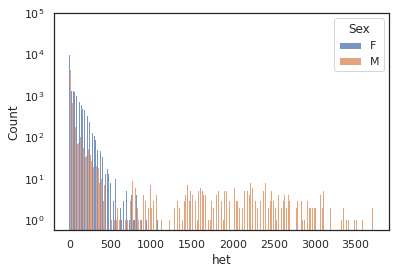

In [18]:
g = sns.histplot(chrX_df, x="het", hue="Sex", multiple="dodge")
g.set_yscale("log")

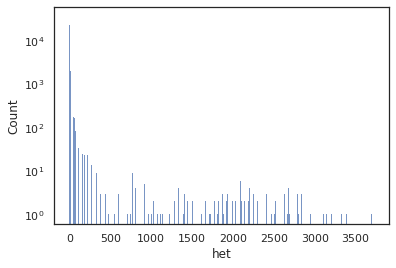

In [19]:
g = sns.histplot(chrX_male, x="het")
g.set_yscale("log")

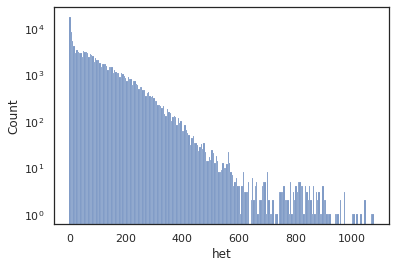

In [20]:
g = sns.histplot(chrX_female, x="het")
g.set_yscale("log")

In [21]:
#Further subsetting
dfs = [chrX_male, chrX_female, chrX_male_old, chrX_female_old]
names = ["male_nonpar_joint", "female_nonpar_joint", "male_nonpar_single", "female_nonpar_single"]
d_d = {}
for (df_j, name) in zip(dfs, names):
    df_i = df_j.loc[df_j.start > 250]
    d_d[name] = {}
    print(len(df_i)/len(df_i["pop"].unique()), len(df_i["pop"].unique()))
    d_d[name]["mean"] = df_i.het.mean()
    d_d[name]["lower quartile"] = df_i.het.quantile(0.25)
    d_d[name]["median"] = df_i.het.quantile(0.5)
    d_d[name]["upper quartile"] = df_i.het.quantile(0.75)
    print("mean", df_i.het.mean())
    print("lower quart", df_i.het.quantile(0.25))
    print("median", df_i.het.quantile(0.5))
    print("upper quart", df_i.het.quantile(0.75))
    
pd.DataFrame(data=d_d)

1149.0 124
mean 16.765602627811
lower quart 1.0
median 3.0
upper quart 10.0
1149.0 93
mean 94.77402509896403
lower quart 16.0
median 67.0
upper quart 142.0
1149.0 96
mean 22.14007651581085
lower quart 0.0
median 4.0
upper quart 14.0
1149.0 64
mean 89.21998748912098
lower quart 16.0
median 61.0
upper quart 131.0


,male_nonpar_joint,female_nonpar_joint,male_nonpar_single,female_nonpar_single
mean,16.77,94.77,22.14,89.22
lower quartile,1.00,16.00,0.00,16.00
median,3.00,67.00,4.00,61.00
upper quartile,10.00,142.00,14.00,131.00


Plotting, in the four X or 7, male or female combinations

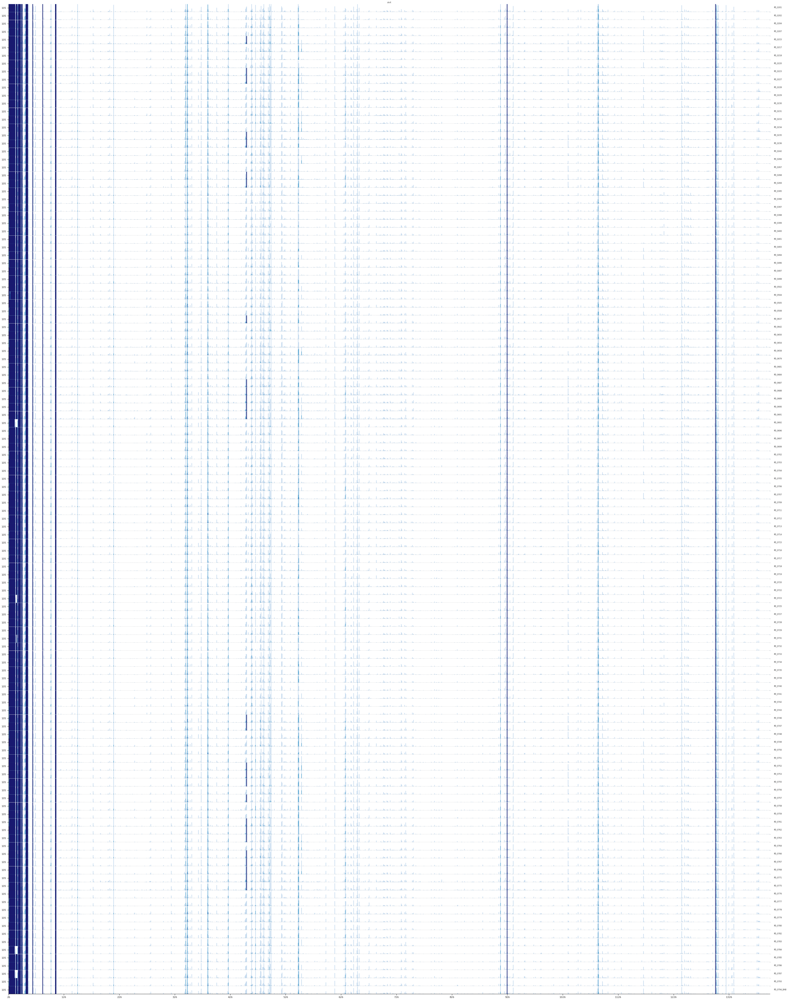

In [22]:
fig = horizonplot(chrX_male, 'het', width=1, col='chrom', row='pop', size=0.5, aspect=100, cut=200)

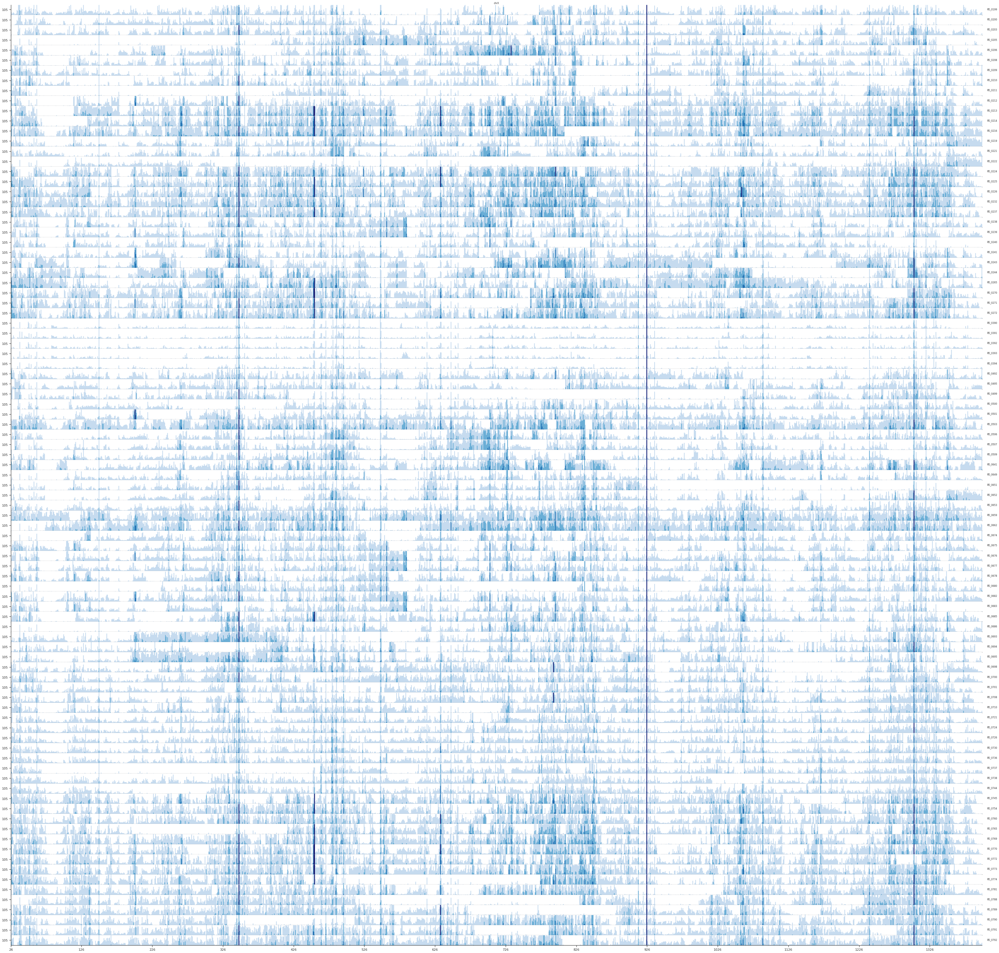

In [23]:
fig = horizonplot(chrX_female, 'het', width=1, col='chrom', row='pop', size=0.5, aspect=100, cut=200)

Finding the two outliers
#PD_0202
#PD_0690
Updated the metadata so they now are set as males.

In [24]:
for i in female_list:
    i_chrX = chrX_female.loc[chrX_female["pop"] == i]
    if i_chrX.het.median() < 20:
        print(i_chrX.het.median(), i)

10.0 PD_0211
6.0 PD_0222
14.0 PD_0390
15.5 PD_0391
15.0 PD_0392
12.0 PD_0393
13.0 PD_0394
12.0 PD_0499
19.0 PD_0651


In [25]:
for i in female_list:
    i_chrX = chrX_female.loc[chrX_female["pop"] == i]
    if i_chrX.het.mean() <= 40:
        print(i_chrX.het.mean(), i)

31.601164483260554 PD_0222
23.74454148471616 PD_0390
26.09825327510917 PD_0391
24.67612809315866 PD_0392
23.729257641921397 PD_0393
23.020378457059678 PD_0394


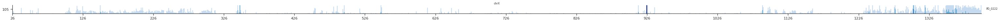

In [26]:
fig = horizonplot(chrX_female.loc[chrX_female["pop"].isin(["PD_0202", "PD_0222", "PD_0690"])]
                                                         , 'het', width=1, col='chrom', row='pop', size=0.5, aspect=100, cut=200)

In [27]:
chr7_df = full_df.loc[full_df.chrom=="chr7"]
chr7_male = chr7_df.loc[chr7_df["pop"].isin(male_list)]
chr7_female = chr7_df.loc[chr7_df["pop"].isin(female_list)]

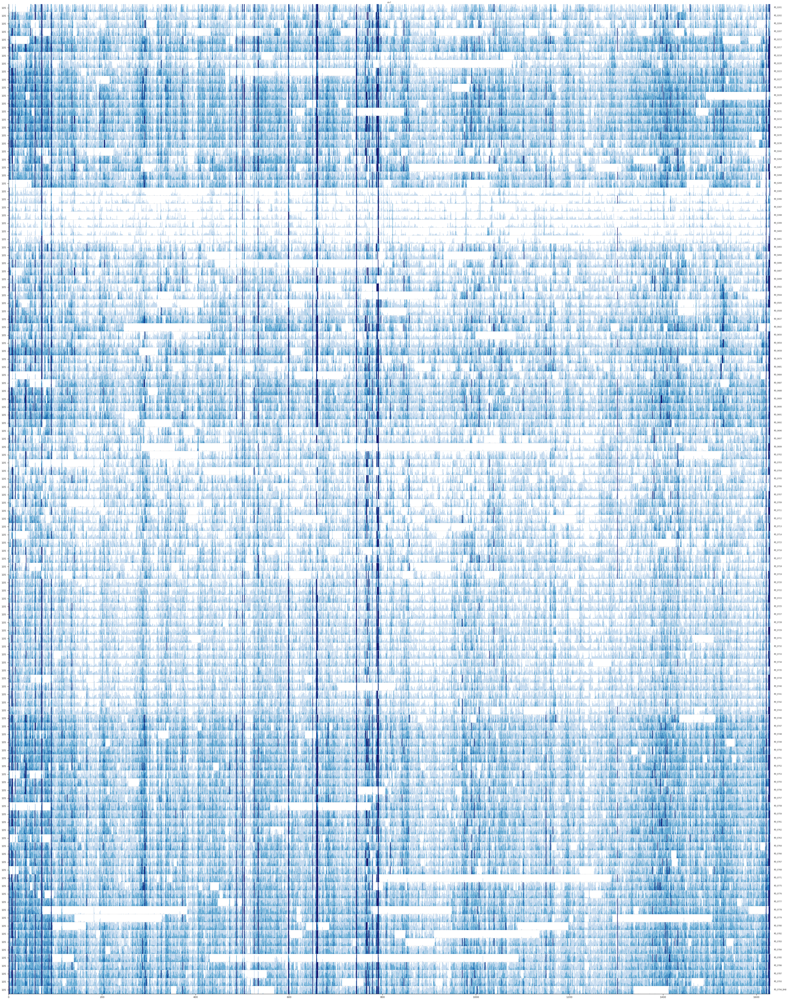

In [28]:
fig = horizonplot(chr7_male, 'het', width=1, col='chrom', row='pop', size=0.5, aspect=100, cut=200)

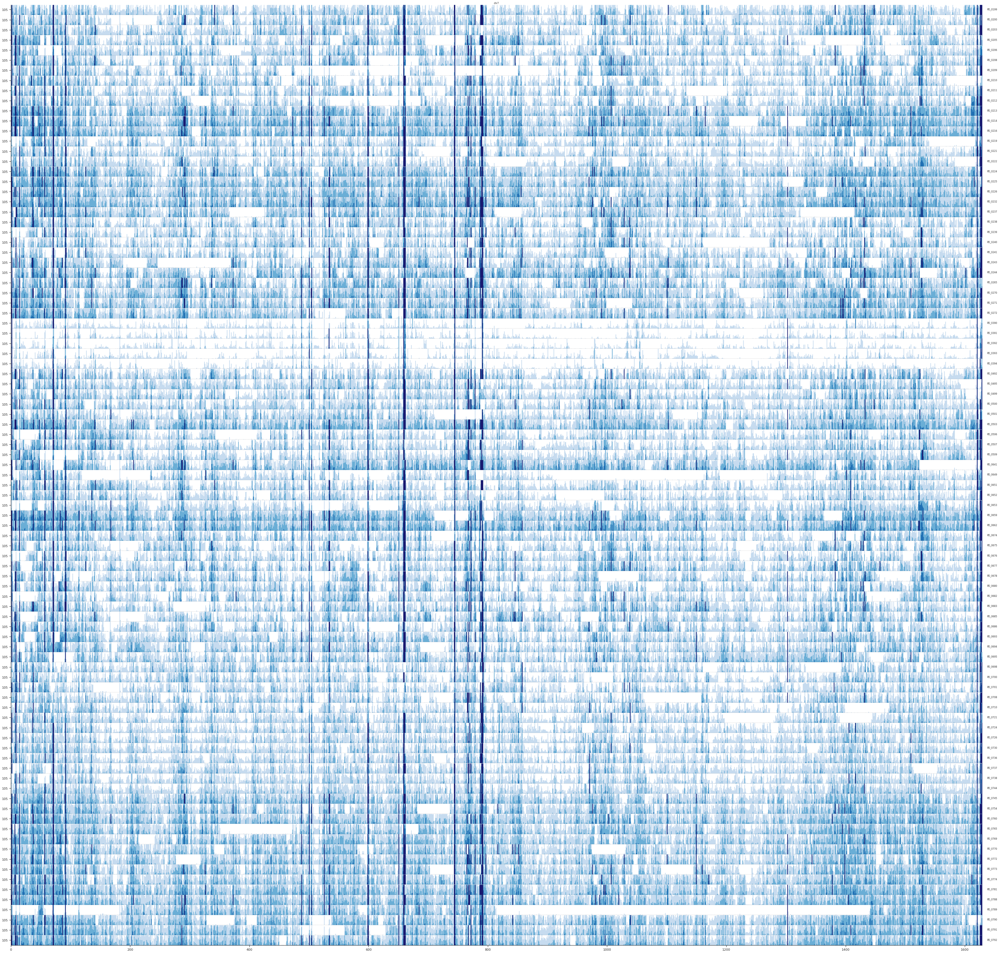

In [29]:
fig = horizonplot(chr7_female, 'het', width=1, col='chrom', row='pop', size=0.5, aspect=100, cut=200)

Plotting on X for each cluster

Anubis, Tanzania
Cynocephalus, Central Tanzania
Cynocephalus, Western Tanzania
Papio, Senegal
Ursinus, Zambia
Hamadryas, Ethiopia
Anubis, Ethiopia
Kindae, Zambia


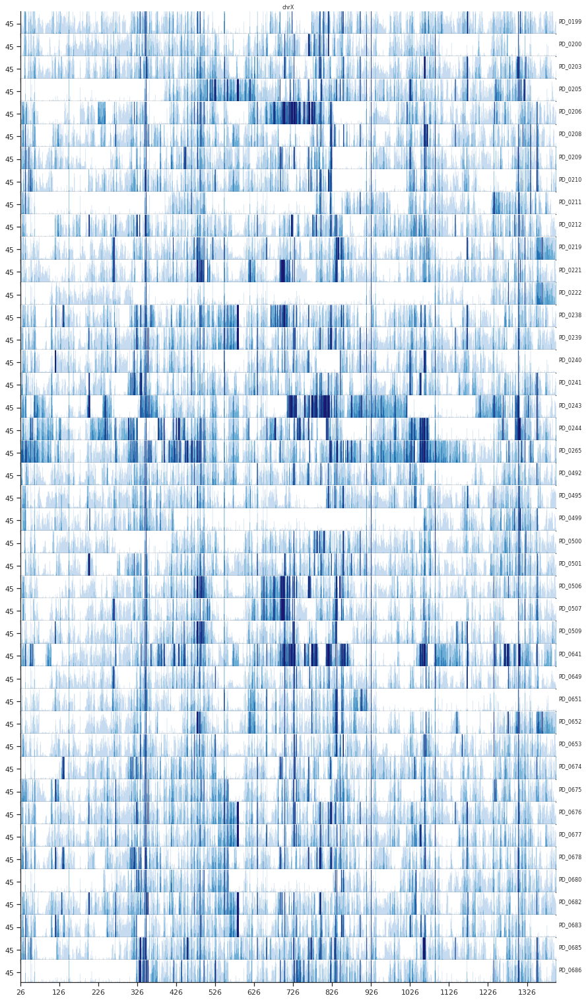

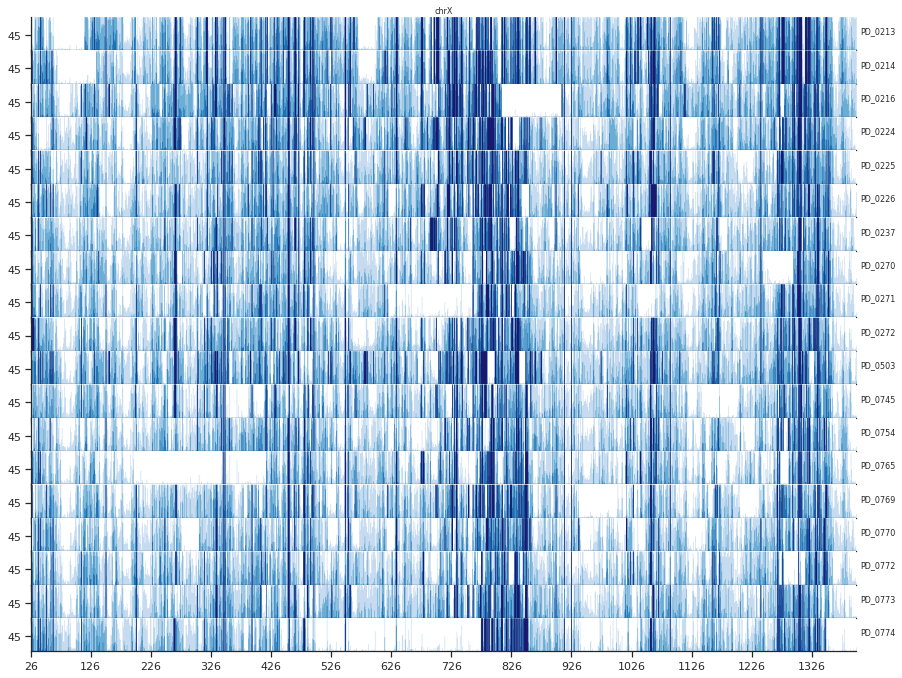

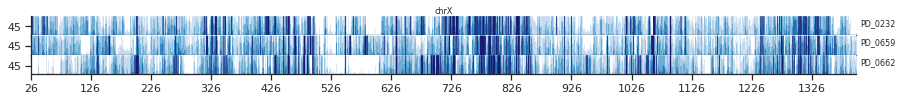

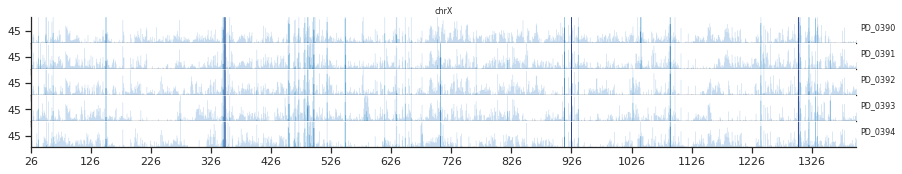

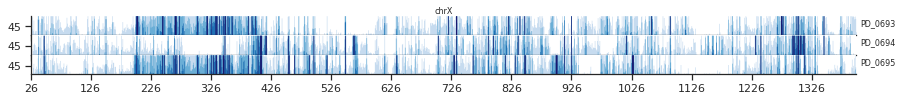

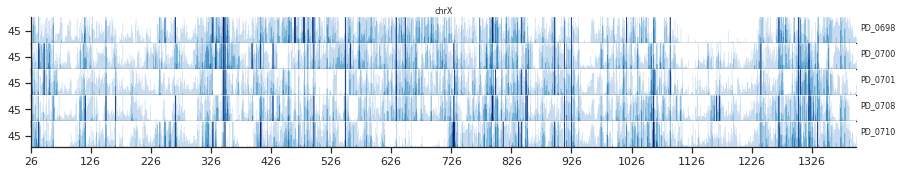

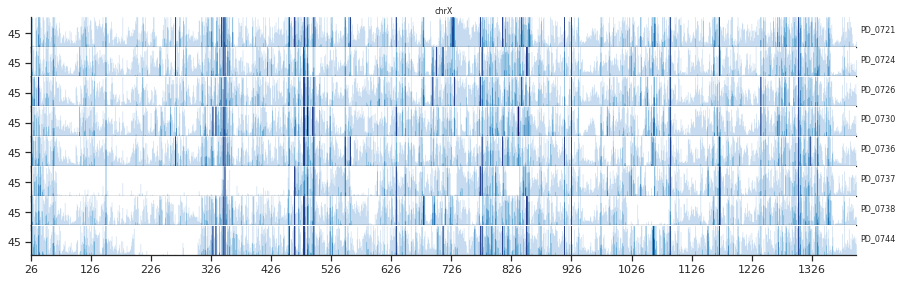

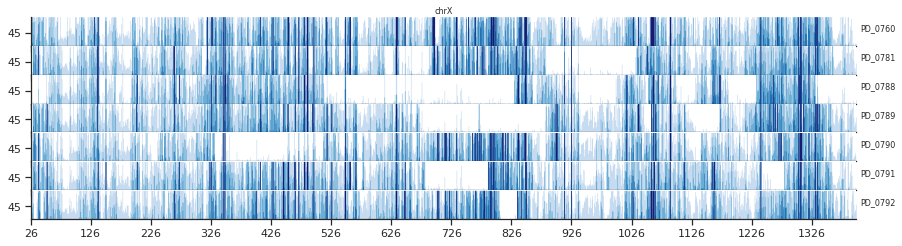

In [45]:
for cluster in meta_data_samples.C_origin.unique():
    print(cluster)
    f_IDs = meta_data_samples.loc[(meta_data_samples.Sex =="F") & (meta_data_samples.C_origin ==cluster)].PGDP_ID.values
    c_chrX = chrX_female.loc[chrX_female["pop"].isin(f_IDs)]
    fig = horizonplot(c_chrX, 'het', width=1, col='chrom', row='pop', size=0.5, aspect=25, cut=100)
    fig.savefig("../results/horizonplot_{}_chrX_cut100".format(cluster))

Anubis, Tanzania
Cynocephalus, Central Tanzania
Cynocephalus, Western Tanzania
Papio, Senegal
Ursinus, Zambia
Hamadryas, Ethiopia
Anubis, Ethiopia
Kindae, Zambia


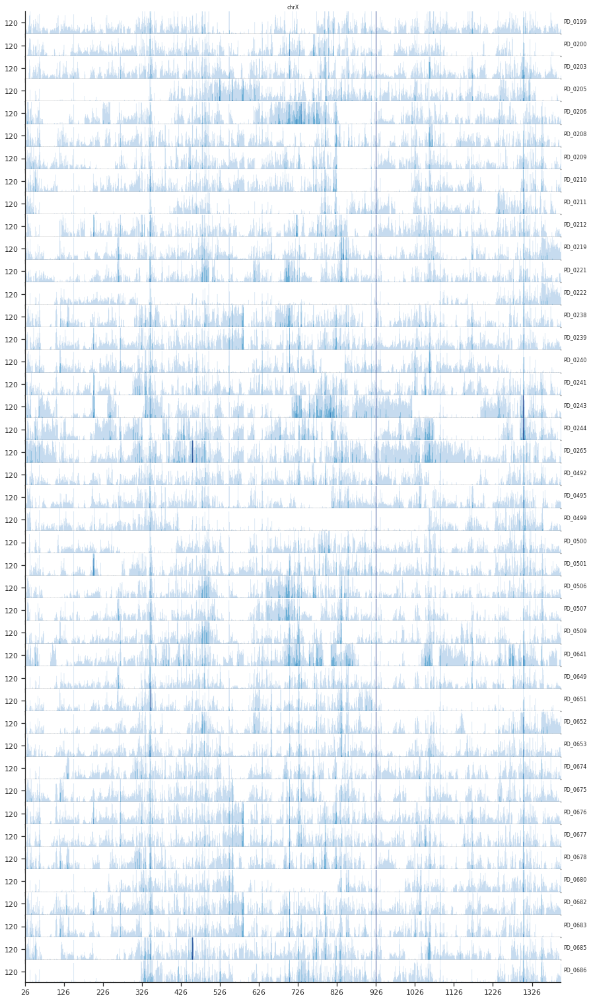

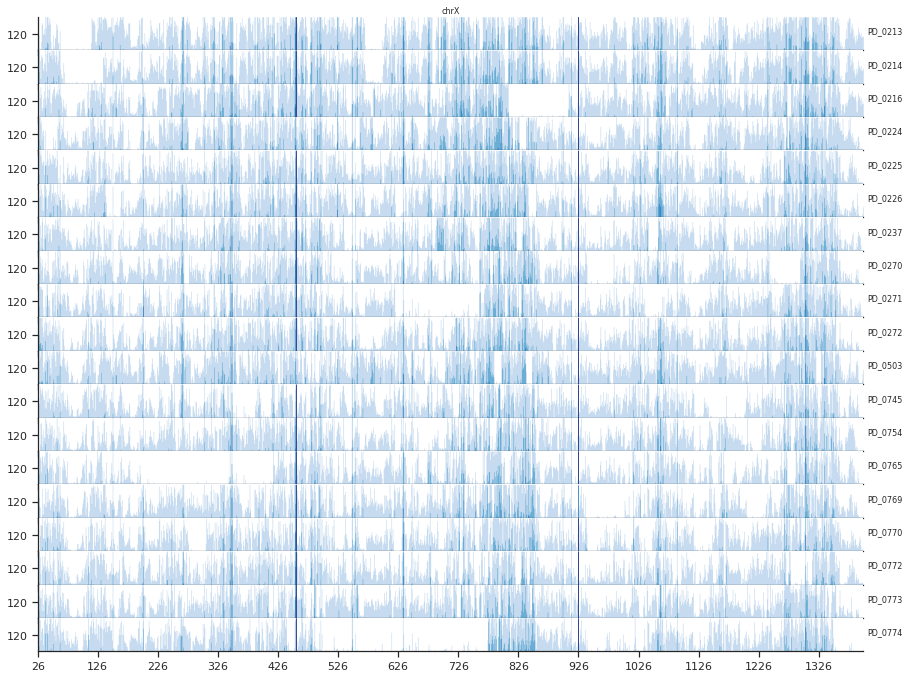

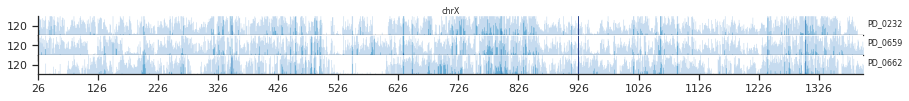

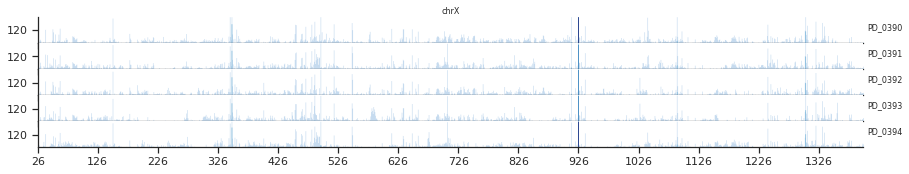

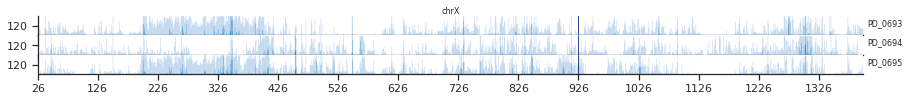

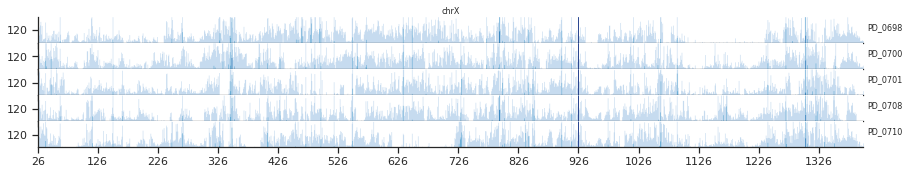

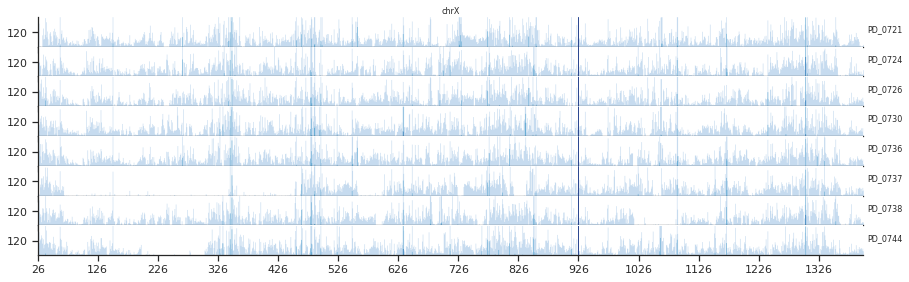

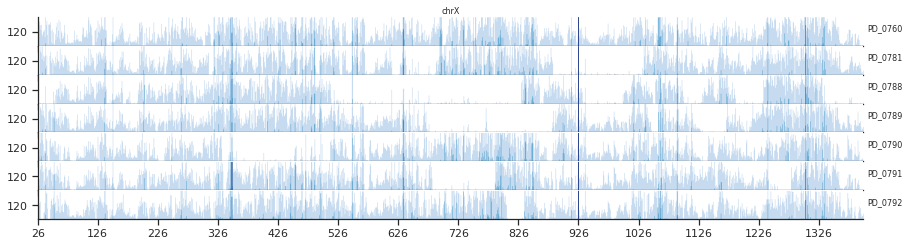

In [46]:
for cluster in meta_data_samples.C_origin.unique():
    print(cluster)
    f_IDs = meta_data_samples.loc[(meta_data_samples.Sex =="F") & (meta_data_samples.C_origin ==cluster)].PGDP_ID.values
    c_chrX = chrX_female.loc[chrX_female["pop"].isin(f_IDs)]
    fig = horizonplot(c_chrX, 'het', width=1, col='chrom', row='pop', size=0.5, aspect=25, cut=250)
    fig.savefig("../results/horizonplot_{}_chrX_cut250".format(cluster))

In [90]:
df_list = []
for cluster in meta_data_samples.C_origin.unique():
    print(cluster)
    f_IDs = meta_data_samples.loc[(meta_data_samples.Sex =="F") & (meta_data_samples.C_origin ==cluster)].PGDP_ID.values
    c_chrX = chrX_female.loc[chrX_female["pop"].isin(f_IDs)]
    df = pd.DataFrame()
    df["mean_het"] = c_chrX.groupby(["start"]).mean()["het"].tolist()
    df.insert(0, column="chrom", value="chrX")
    df.insert(1, column="start", value=c_chrX["start"].unique())
    df.insert(2, column = "pop", value = cluster)
    df_list.append(df)
mean_df = pd.concat(df_list, axis=0)

Anubis, Tanzania
Cynocephalus, Central Tanzania
Cynocephalus, Western Tanzania
Papio, Senegal
Ursinus, Zambia
Hamadryas, Ethiopia
Anubis, Ethiopia
Kindae, Zambia


In [89]:
mean_df

,chrom,start,pop,het
0,chrX,26,"Anubis, Tanzania",122.33
1,chrX,27,"Anubis, Tanzania",75.37
2,chrX,28,"Anubis, Tanzania",67.53
3,chrX,29,"Anubis, Tanzania",84.74
4,chrX,30,"Anubis, Tanzania",71.33
...,...,...,...,...
1369,chrX,1395,"Kindae, Zambia",24.57
1370,chrX,1396,"Kindae, Zambia",12.29
1371,chrX,1397,"Kindae, Zambia",21.43
1372,chrX,1398,"Kindae, Zambia",15.29


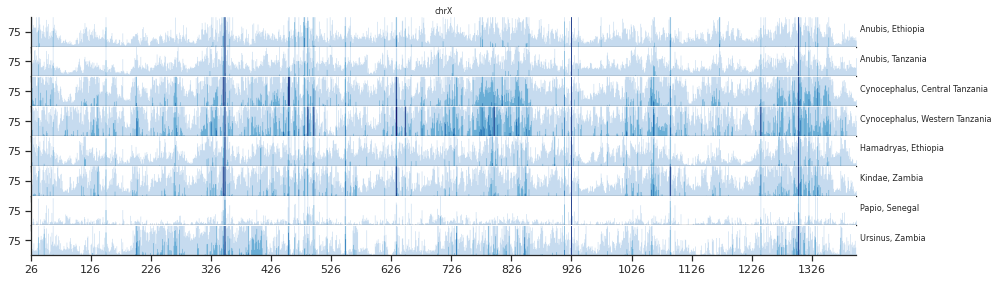

In [95]:
fig = horizonplot(mean_df, 'mean_het', width=1, col='chrom', row='pop', size=0.5, aspect=25, cut=150)
fig.savefig("../results/horizonplot_chrX_mean_cluster")